In [1]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

from scipy.stats import zscore
from sklearn.impute import KNNImputer
from scipy.spatial import distance
from scipy.interpolate import interp1d
from scipy import stats
from scipy.stats import chi2
from scipy.spatial.distance import mahalanobis

In [2]:
from pathlib import Path
print(Path.cwd())

from os import walk

# folder path
dir_path = r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Sang_Code_Processing_2024\0. Raw data\Year 3\Desigo\BTU\TABS'

file_list = []
for (dir_path, dir_names, file_names) in walk(dir_path):
    file_list.extend(file_names)
    # don't look inside any subdirectory
    break
print(file_list)

c:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Code Year3
['HZ_BTU1(Total)_energy_Y3_raw.csv', 'HZ_BTU1(Total)_flow_Y3_raw.csv', 'HZ_BTU1(Total)_ReturnT_Y3_raw.csv', 'HZ_BTU1(Total)_SupplyT_Y3_raw.csv', 'HZ_BTU10(Z21+22+23+24+25+26+27)_energy_Y3_raw.csv', 'HZ_BTU10(Z21+22+23+24+25+26+27)_flow_Y3_raw.csv', 'HZ_BTU10(Z21+22+23+24+25+26+27)_ReturnT_Y3_raw.csv', 'HZ_BTU10(Z21+22+23+24+25+26+27)_SupplyT_Y3_raw.csv', 'HZ_BTU11(Z32+33)_energy_Y3_raw.csv', 'HZ_BTU11(Z32+33)_flow_Y3_raw.csv', 'HZ_BTU11(Z32+33)_ReturnT_Y3_raw.csv', 'HZ_BTU11(Z32+33)_SupplyT_Y3_raw.csv', 'HZ_BTU13(Z31)_energy_Y3_raw.csv', 'HZ_BTU13(Z31)_flow_Y3_raw.csv', 'HZ_BTU13(Z31)_ReturnT_Y3_raw.csv', 'HZ_BTU13(Z31)_SupplyT_Y3_raw.csv', 'HZ_BTU5(Z2+3+4+5)_energy_Y3_raw.csv', 'HZ_BTU5(Z2+3+4+5)_flow_Y3_raw.csv', 'HZ_BTU5(Z2+3+4+5)_ReturnT_Y3_raw.csv', 'HZ_BTU5(Z2+3+4+5)_SupplyT_Y3_raw.csv', 'HZ_BTU6(Z1)_energy_Y3_raw.csv', 'HZ_BTU6(Z1)_flow_Y3_raw.csv', 'HZ_BTU6(Z1)_ReturnT_Y3_raw.csv'

In [3]:
import pandas as pd
import os

Lst = []
for file_name in file_list:
    file_path = os.path.join(dir_path, file_name)
    data = pd.read_csv(file_path, parse_dates=['Timestamp'], index_col=[0])
    df = pd.DataFrame(data)
    filtered_df = df[df['QualityGood'] == True]
    print(len(filtered_df))
    Lst.append(filtered_df)

523291
523291
523290
523289
523289
523289
523289
523290
523288
523288
523288
523237
523289
523290
523288
523288
523286
523285
523284
523283
523285
523285
523284
523285
523284
523285
523284
523284
523280
523280
523282
523283


In [4]:
Lst_diff = []
Lst_name = []

for i in range(0,len(Lst)):
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    Z = pd.to_numeric(Lst[i][zone_name])
    temp = Z.diff()
    Lst_diff.append(temp.sort_values(ascending=True)[-100:-1].tolist())
    
# print (Lst_diff)

df = pd.DataFrame(Lst_diff).transpose()

df.columns = Lst_name

q_values = df.quantile(0.75)

In [5]:
q_values

BTU1(Total)_energy (kBTU/h)                      29.687563
BTU1(Total)_flow (GPM)                            8.088743
BTU1(Total)_ReturnT (F)                           2.545593
BTU1(Total)_SupplyT (F)                           8.077030
BTU10(Z21+22+23+24+25+26+27)_energy (kBTU/h)     17.556448
BTU10(Z21+22+23+24+25+26+27)_flow (GPM)           3.032963
BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)          3.571564
BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)         10.956230
BTU11(Z32+33)_energy (kBTU/h)                          NaN
BTU11(Z32+33)_flow (GPM)                          1.441313
BTU11(Z32+33)_ReturnT (F)                         3.748863
BTU11(Z32+33)_SupplyT (F)                        10.055023
BTU13(Z31)_energy (kBTU/h)                        1.806528
BTU13(Z31)_flow (GPM)                             0.506884
BTU13(Z31)_ReturnT (F)                            0.708614
BTU13(Z31)_SupplyT (F)                            5.722324
BTU5(Z2+3+4+5)_energy (kBTU/h)                    6.6416

In [6]:
Lst_Slab = []
Lst_name = []
Zone_DF = pd.DataFrame()
res = 1

for i in range(0,len(Lst)):
    
    Lst[i].index = pd.to_datetime(Lst[i].index, errors='coerce', utc=True, format='mixed')
    Lst[i].index = Lst[i].index.tz_convert('US/Eastern')
    
    Lst[i] = Lst[i].resample("1T").mean().ffill()
    
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    Z = pd.to_numeric(Lst[i][zone_name])
    Lst_Slab.append(Z.tolist())
    
    Zone_DF[zone_name] = pd.Series(Z, index=Lst[i].index)
    
Zone_DF

C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version,

,BTU1(Total)_energy (kBTU/h),BTU1(Total)_flow (GPM),BTU1(Total)_ReturnT (F),BTU1(Total)_SupplyT (F),BTU10(Z21+22+23+24+25+26+27)_energy (kBTU/h),BTU10(Z21+22+23+24+25+26+27)_flow (GPM),BTU10(Z21+22+23+24+25+26+27)_ReturnT (F),BTU10(Z21+22+23+24+25+26+27)_SupplyT (F),BTU11(Z32+33)_energy (kBTU/h),BTU11(Z32+33)_flow (GPM),...,BTU6(Z1)_ReturnT (F),BTU6(Z1)_SupplyT (F),BTU7(Z14+15+16+17)_energy (kBTU/h),BTU7(Z14+15+16+17)_flow (GPM),BTU7(Z14+15+16+17)_ReturnT (F),BTU7(Z14+15+16+17)_SupplyT (F),BTU8(Z11+12+13)_energy (kBTU/h),BTU8(Z11+12+13)_flow (GPM),BTU8(Z11+12+13)_ReturnT (F),BTU8(Z11+12+13)_SupplyT (F)
Timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-01 00:00:00-04:00,0.0,0.0,83.917412,85.046165,0.0,0.0,73.908852,75.042725,0.0,0.0,...,71.603706,72.256844,0.0,0.0,75.570213,73.890495,0.0,0.0,74.400757,73.609962
2022-06-01 00:01:00-04:00,0.0,0.0,83.913918,85.040039,0.0,0.0,73.904861,75.054893,0.0,0.0,...,71.607903,72.255623,0.0,0.0,75.569206,73.887680,0.0,0.0,74.390053,73.598000
2022-06-01 00:02:00-04:00,0.0,0.0,83.896118,85.022797,0.0,0.0,73.902718,75.033371,0.0,0.0,...,71.612122,72.246162,0.0,0.0,75.572350,73.888268,0.0,0.0,74.396141,73.587463
2022-06-01 00:03:00-04:00,0.0,0.0,83.887604,85.019150,0.0,0.0,73.889328,75.030197,0.0,0.0,...,71.590767,72.220711,0.0,0.0,75.552422,73.853745,0.0,0.0,74.362030,73.569939
2022-06-01 00:04:00-04:00,0.0,0.0,83.866783,84.995293,0.0,0.0,73.886642,75.029938,0.0,0.0,...,71.575348,72.210350,0.0,0.0,75.554054,73.896591,0.0,0.0,74.352654,73.556198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-31 23:55:00-04:00,0.0,0.0,80.541298,81.010849,0.0,0.0,73.083733,72.980690,0.0,0.0,...,73.038582,72.436317,0.0,0.0,72.235390,73.049339,0.0,0.0,73.322998,72.683426
2023-05-31 23:56:00-04:00,0.0,0.0,80.568047,81.021858,0.0,0.0,73.105667,73.002213,0.0,0.0,...,73.044090,72.438828,0.0,0.0,72.259453,73.094818,0.0,0.0,73.294876,72.661217
2023-05-31 23:57:00-04:00,0.0,0.0,80.566994,81.008560,0.0,0.0,73.082695,72.952118,0.0,0.0,...,73.033127,72.416672,0.0,0.0,72.256577,73.091911,0.0,0.0,73.313049,72.669907


In [7]:
Zone_DF.columns.values

array(['BTU1(Total)_energy (kBTU/h)', 'BTU1(Total)_flow (GPM)',
       'BTU1(Total)_ReturnT (F)', 'BTU1(Total)_SupplyT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_energy (kBTU/h)',
       'BTU10(Z21+22+23+24+25+26+27)_flow (GPM)',
       'BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)',
       'BTU11(Z32+33)_energy (kBTU/h)', 'BTU11(Z32+33)_flow (GPM)',
       'BTU11(Z32+33)_ReturnT (F)', 'BTU11(Z32+33)_SupplyT (F)',
       'BTU13(Z31)_energy (kBTU/h)', 'BTU13(Z31)_flow (GPM)',
       'BTU13(Z31)_ReturnT (F)', 'BTU13(Z31)_SupplyT (F)',
       'BTU5(Z2+3+4+5)_energy (kBTU/h)', 'BTU5(Z2+3+4+5)_flow (GPM)',
       'BTU5(Z2+3+4+5)_ReturnT (F)', 'BTU5(Z2+3+4+5)_SupplyT (F)',
       'BTU6(Z1)_energy (kBTU/h)', 'BTU6(Z1)_flow (GPM)',
       'BTU6(Z1)_ReturnT (F)', 'BTU6(Z1)_SupplyT (F)',
       'BTU7(Z14+15+16+17)_energy (kBTU/h)',
       'BTU7(Z14+15+16+17)_flow (GPM)', 'BTU7(Z14+15+16+17)_ReturnT (F)',
       'BTU7(Z14+15+16+17)_SupplyT (F)',
    

<Axes: xlabel='Timestamp'>

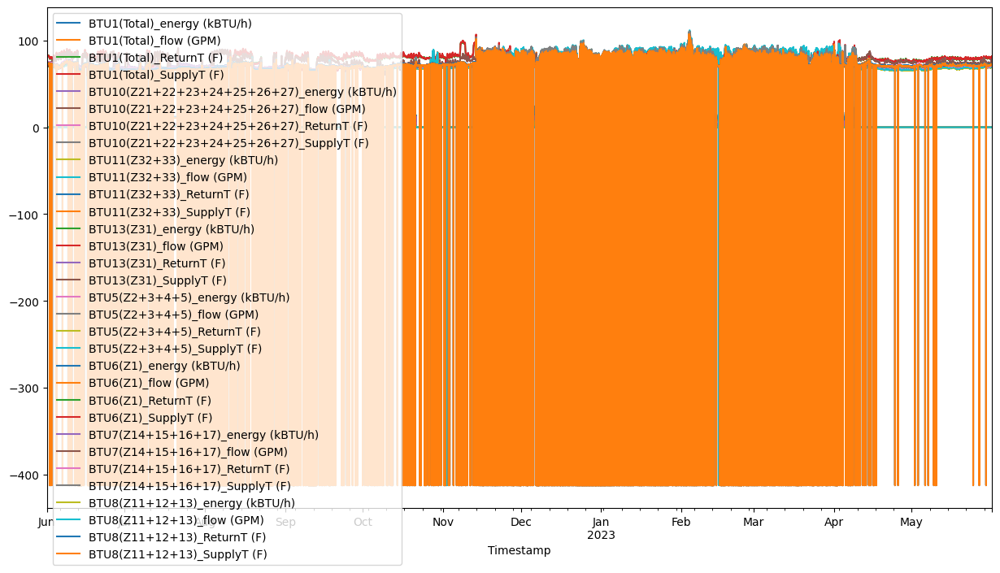

In [8]:
Zone_DF.plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

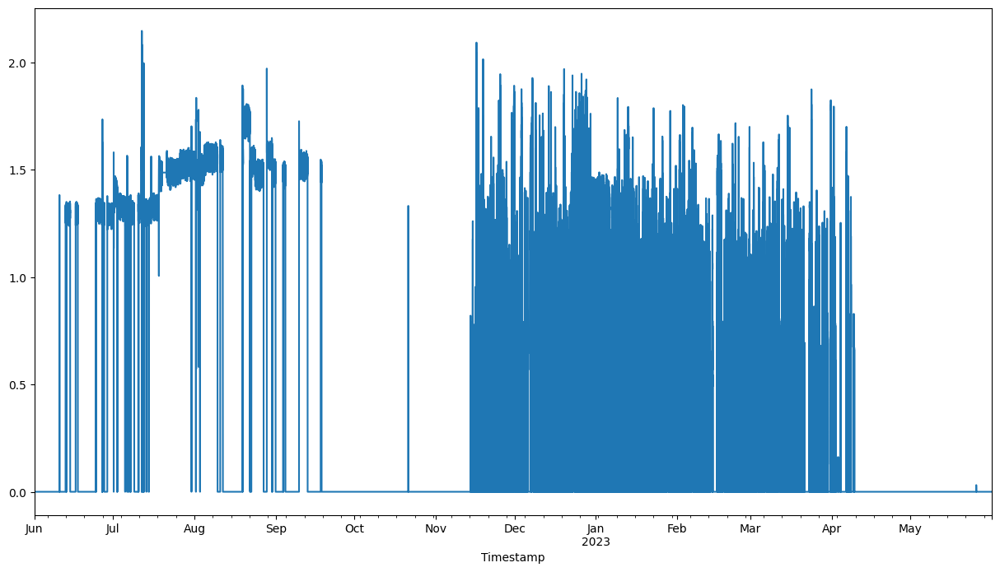

In [9]:
Zone_DF["BTU8(Z11+12+13)_flow (GPM)"].plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

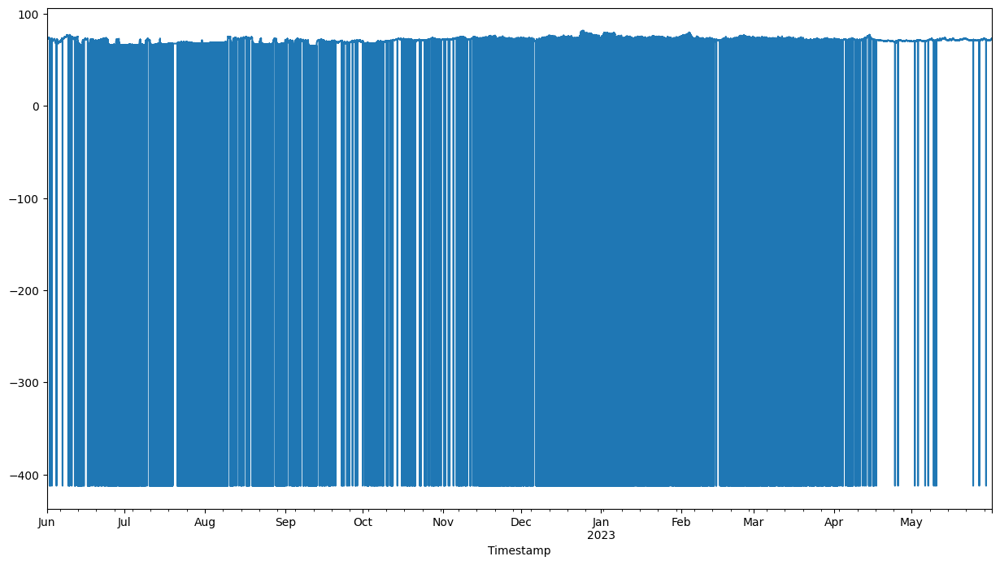

In [10]:
Zone_DF["BTU8(Z11+12+13)_ReturnT (F)"].plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

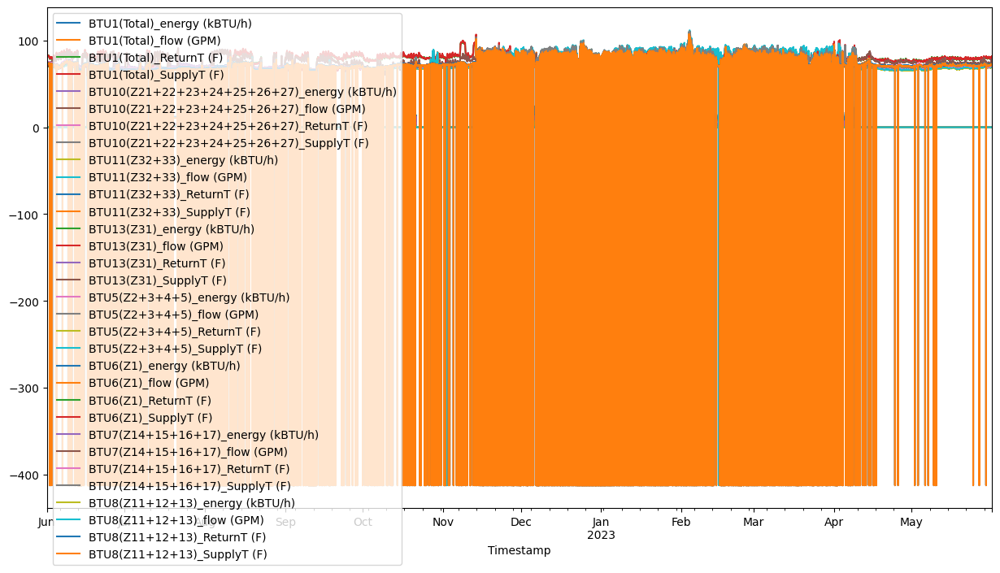

In [11]:
Zone_DF.plot(figsize=(15, 8))

In [12]:
Zone_DF[Zone_DF < -100] = np.nan
# Zone_DF.plot(figsize=(15, 8))

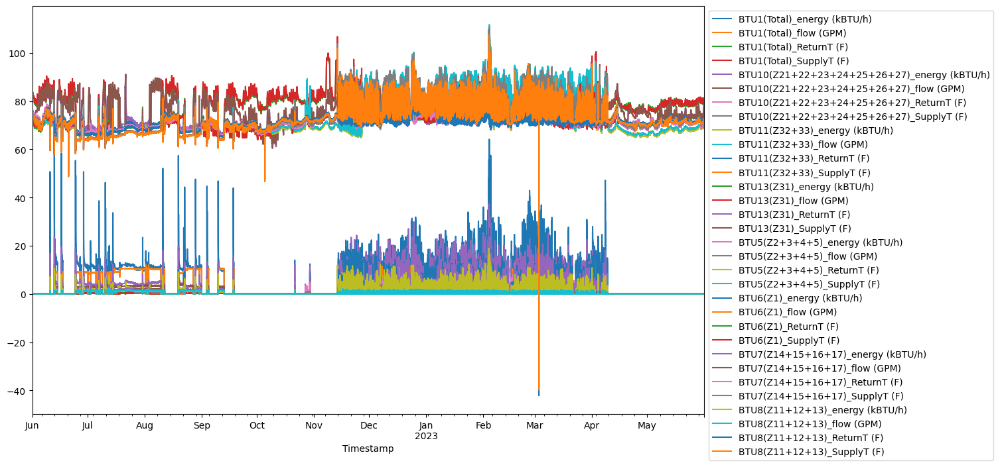

In [13]:
# Place a legend outside the plot
Zone_DF.plot(figsize=(15, 8))
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Adjust the subplot parameters to give the plot more room for the legend
plt.subplots_adjust(right=0.8)

In [14]:
df = Zone_DF

In [15]:
# Filter columns containing "(F)"
columns_with_F = [col for col in Zone_DF.columns if "(F)" in col]
# Filter columns not containing "(F)"
columns_without_F = [col for col in Zone_DF.columns if "(F)" not in col]

# Create two DataFrames based on the filter
df_with_F = Zone_DF[columns_with_F]
df_without_F = Zone_DF[columns_without_F]

In [16]:
columns_with_F

['BTU1(Total)_ReturnT (F)',
 'BTU1(Total)_SupplyT (F)',
 'BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)',
 'BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)',
 'BTU11(Z32+33)_ReturnT (F)',
 'BTU11(Z32+33)_SupplyT (F)',
 'BTU13(Z31)_ReturnT (F)',
 'BTU13(Z31)_SupplyT (F)',
 'BTU5(Z2+3+4+5)_ReturnT (F)',
 'BTU5(Z2+3+4+5)_SupplyT (F)',
 'BTU6(Z1)_ReturnT (F)',
 'BTU6(Z1)_SupplyT (F)',
 'BTU7(Z14+15+16+17)_ReturnT (F)',
 'BTU7(Z14+15+16+17)_SupplyT (F)',
 'BTU8(Z11+12+13)_ReturnT (F)',
 'BTU8(Z11+12+13)_SupplyT (F)']

In [17]:
# Update 'Lst_name' to contain the names of columns that include "(F)".
Lst_name = columns_with_F

In [18]:
# Checking the type of the element in the q_values of 'Lst_name' (This should show a numpy float!)
type(q_values[Lst_name][0])

C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\2880792931.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  type(q_values[Lst_name][0])


numpy.float64

In [19]:
for i in range(0,len(Lst_name)):
    df = df_with_F[Lst_name[i]]
#     print (abs(df.diff())> q_values[Lst_name][i])
#     df_with_F[Lst_name[i]] = df.drop(df[abs(df.diff())> q_values[Lst_name][i]].index)

#If the absolute difference between consecutive values is greater than 5, drop them.
    df_with_F[Lst_name[i]] = df.drop(df[abs(df.diff())> 5].index)

C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\2857651773.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_with_F[Lst_name[i]] = df.drop(df[abs(df.diff())> 5].index)


<Axes: xlabel='Timestamp'>

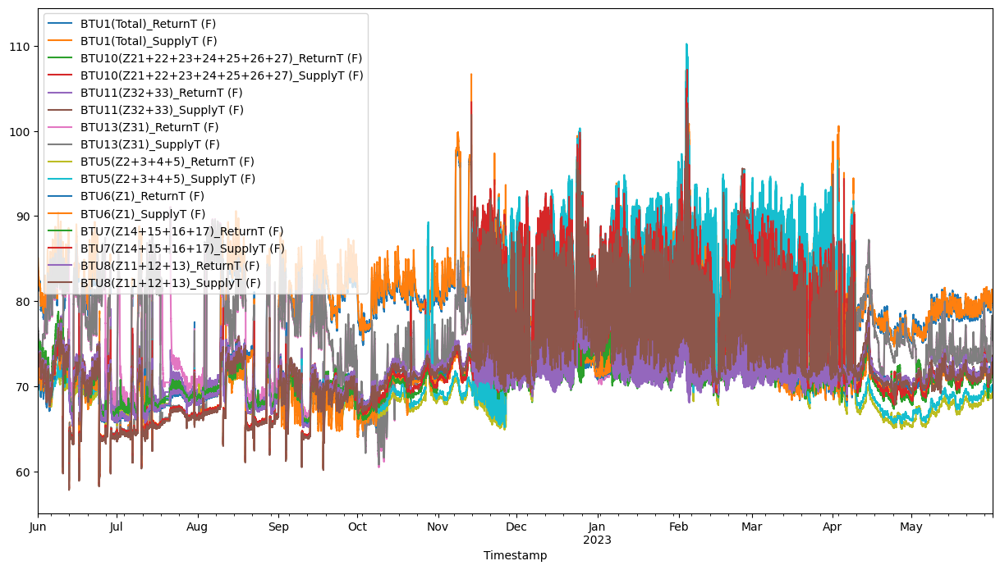

In [20]:
df_with_F.plot(figsize=(15, 8))

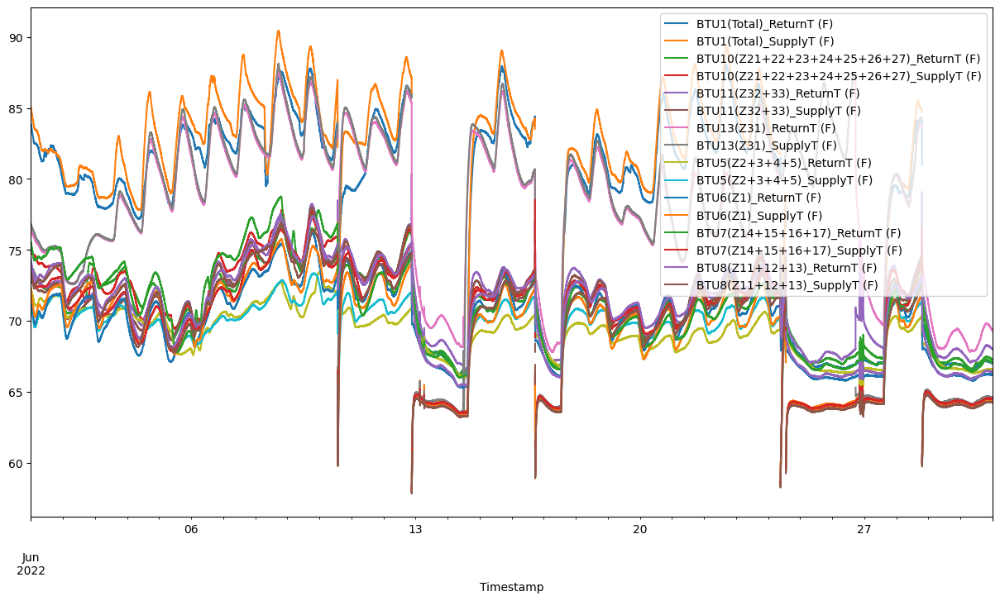

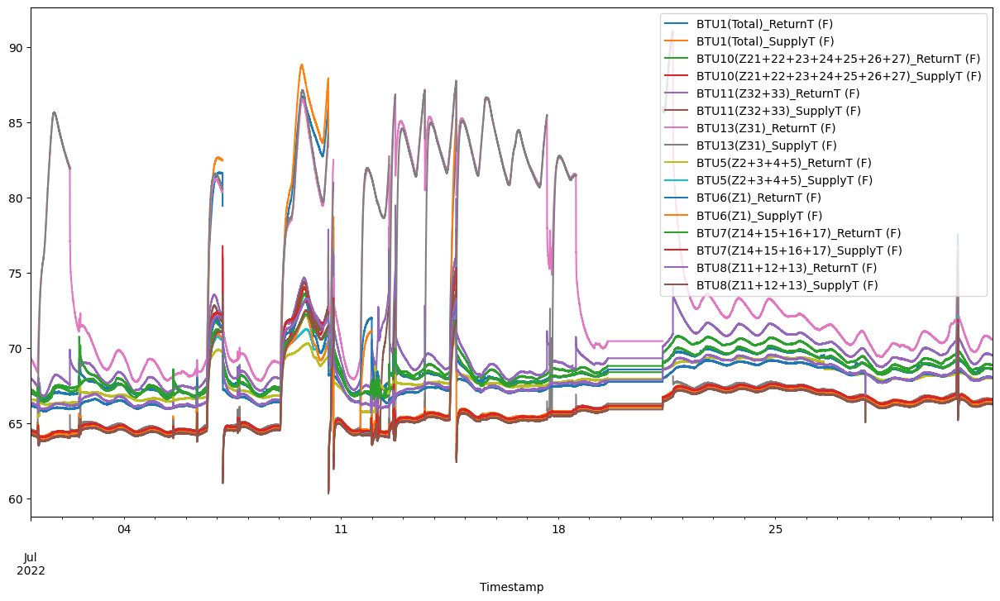

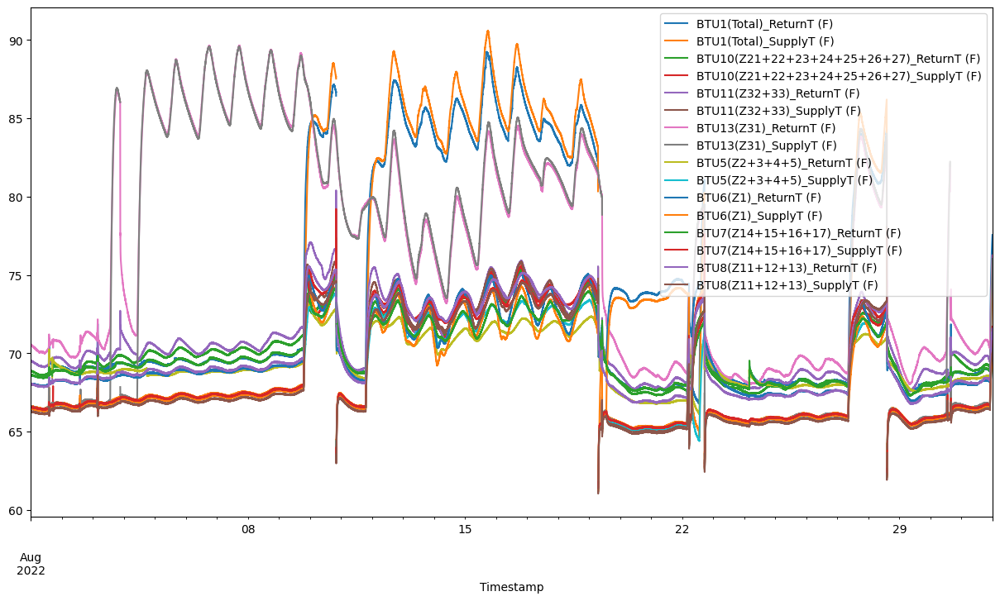

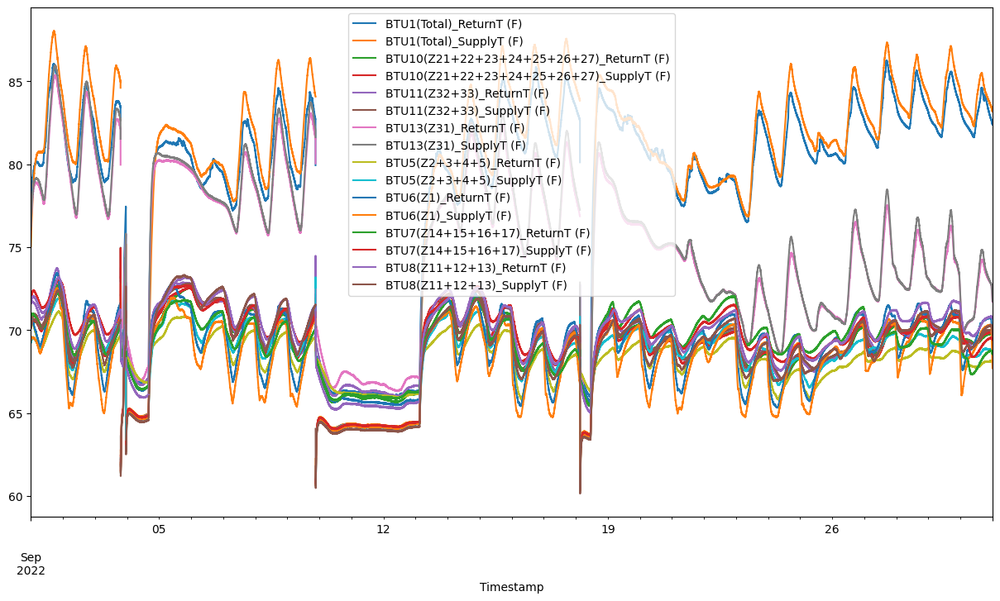

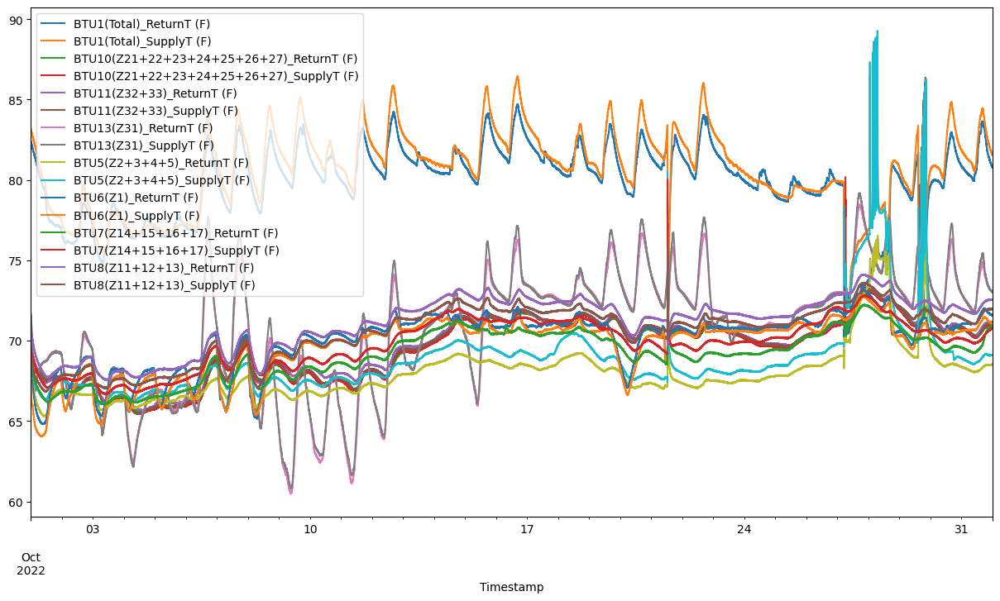

...

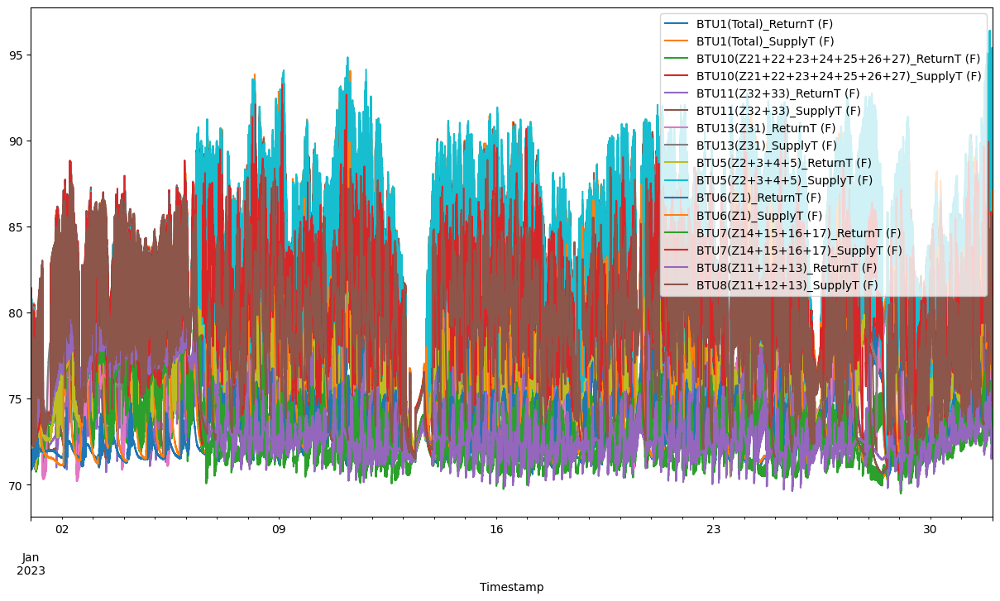

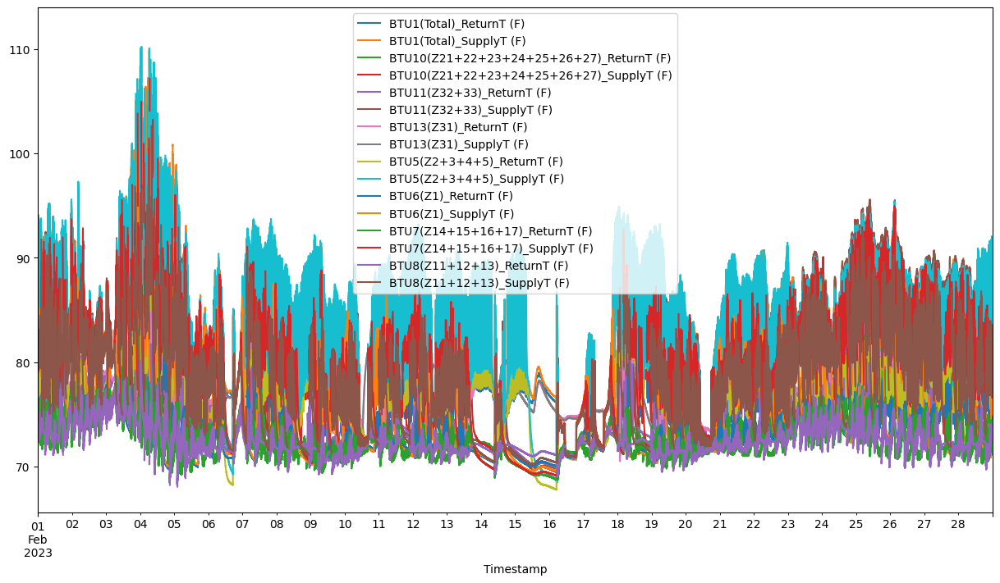

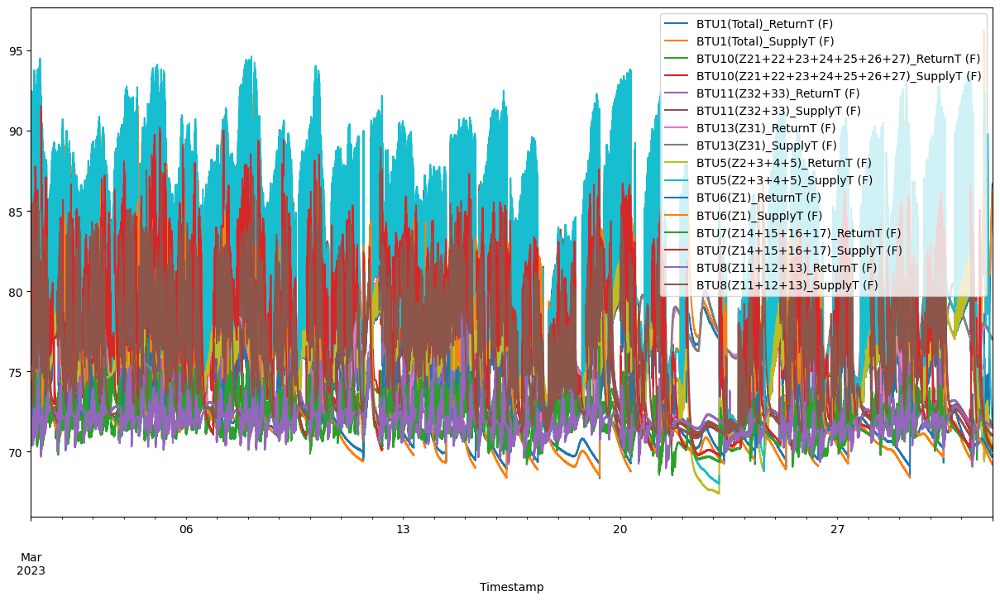

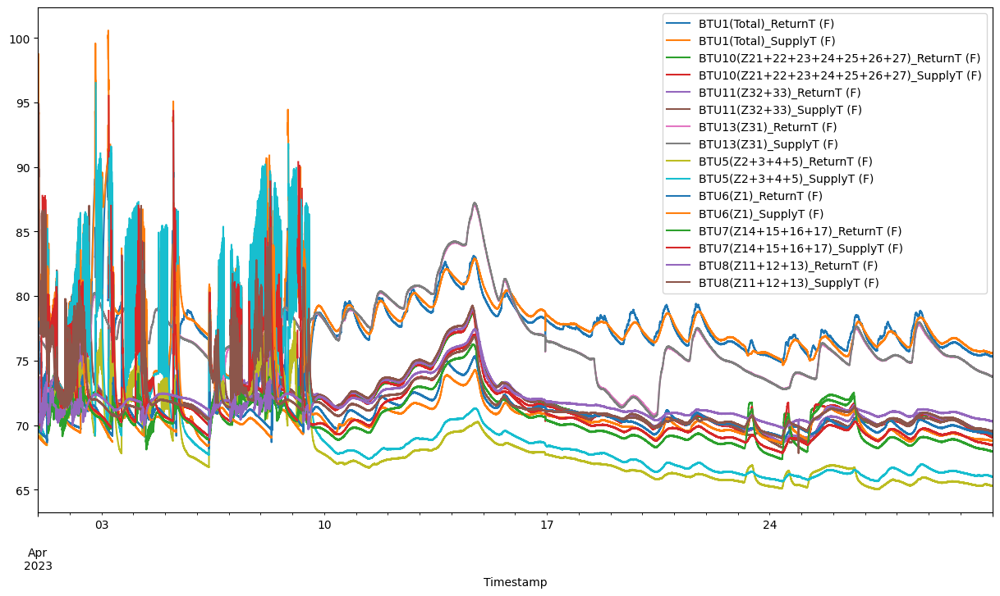

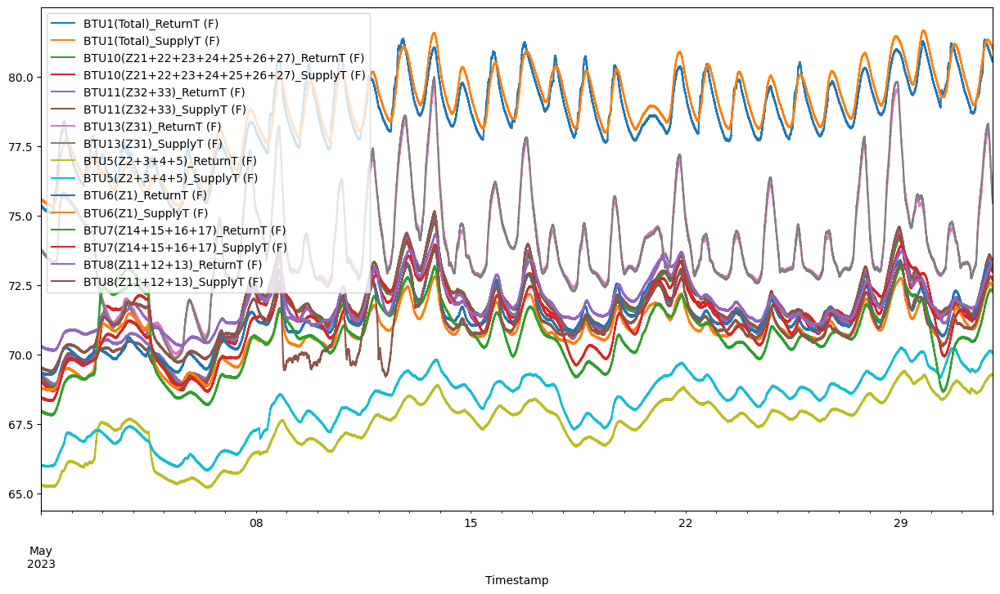

In [21]:
# Then, group by year and week number and apply Mahalanobis distance function
for (year, month), group in df_with_F.groupby([df_with_F.index.year, df_with_F.index.month]):

    group.plot(figsize=(15, 8))
    

In [22]:
def mahalanobis_distance(x, data):
    """Calculate the Mahalanobis distance for each observation in x from the distribution of data"""
    x_minus_mu = x - np.mean(data)
    cov = np.cov(data.values.T)
    inv_covmat = np.linalg.inv(cov)
    left_term = np.dot(x_minus_mu, inv_covmat)
    mahal = np.dot(left_term, x_minus_mu.T)
    return mahal.diagonal()

def remove_outliers(df, columns):
    # Assuming df has a datetime index, group by year and month
    groups = df.groupby([df.index.year, df.index.month])
    
    # Process each group
    for (year, month), group in groups:
        feature_set = group[columns]
        
        # Skip groups with less data points than columns to avoid singular matrix error
        if feature_set.shape[0] <= feature_set.shape[1]:
            continue
        
        # Compute the Mahalanobis distance for each observation
        group['mahalanobis'] = mahalanobis_distance(x=feature_set, data=feature_set)
        # Calculate the p-value for each Mahalanobis distance
        group['p_value'] = 1 - chi2.cdf(group['mahalanobis'], df=feature_set.shape[1])
        
        # Choose a significance level
        significance_level = 0.005
        # Identify outliers
        outliers = group['p_value'] < significance_level
        # Set outliers to NaN
        df.loc[group[outliers].index, columns] = np.nan
    
    # Drop columns for Mahalanobis distance and p-value if they exist
    df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)
    
    return df

# Define subsets for each zone
Zone_Temp_base = ['BTU1(Total)_ReturnT (F)', 'BTU1(Total)_SupplyT (F)','BTU5(Z2+3+4+5)_ReturnT (F)', 'BTU5(Z2+3+4+5)_SupplyT (F)',
       'BTU6(Z1)_ReturnT (F)', 'BTU6(Z1)_SupplyT (F)',
       'BTU7(Z14+15+16+17)_ReturnT (F)', 'BTU7(Z14+15+16+17)_SupplyT (F)', 'BTU8(Z11+12+13)_ReturnT (F)', 'BTU8(Z11+12+13)_SupplyT (F)']
Zone_Temp_fir = ['BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)',
       'BTU11(Z32+33)_ReturnT (F)', 'BTU11(Z32+33)_SupplyT (F)',
       'BTU13(Z31)_ReturnT (F)', 'BTU13(Z31)_SupplyT (F)']


In [23]:
df_with_F.columns.values

array(['BTU1(Total)_ReturnT (F)', 'BTU1(Total)_SupplyT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)',
       'BTU11(Z32+33)_ReturnT (F)', 'BTU11(Z32+33)_SupplyT (F)',
       'BTU13(Z31)_ReturnT (F)', 'BTU13(Z31)_SupplyT (F)',
       'BTU5(Z2+3+4+5)_ReturnT (F)', 'BTU5(Z2+3+4+5)_SupplyT (F)',
       'BTU6(Z1)_ReturnT (F)', 'BTU6(Z1)_SupplyT (F)',
       'BTU7(Z14+15+16+17)_ReturnT (F)', 'BTU7(Z14+15+16+17)_SupplyT (F)',
       'BTU8(Z11+12+13)_ReturnT (F)', 'BTU8(Z11+12+13)_SupplyT (F)'],
      dtype=object)

<Axes: xlabel='Timestamp'>

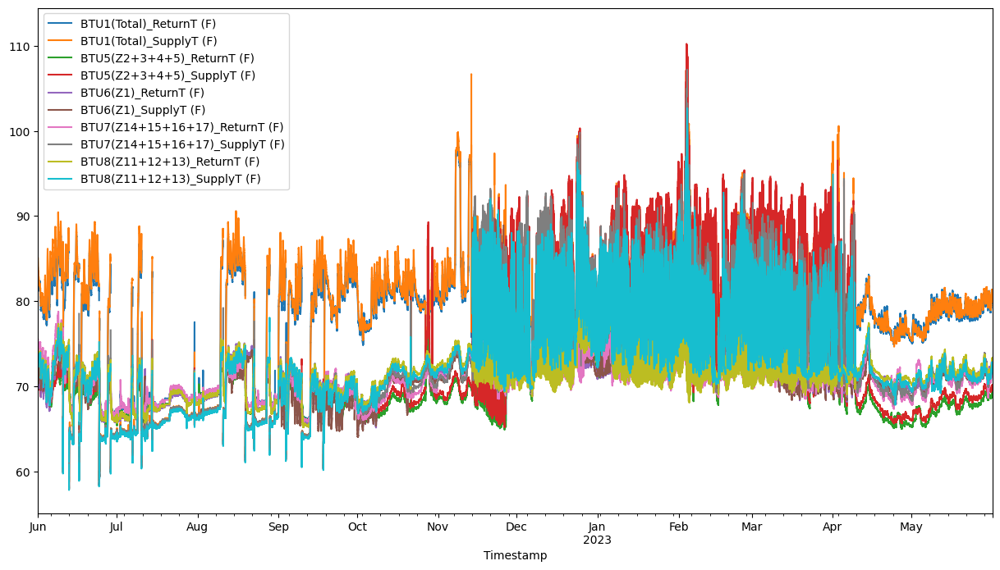

In [24]:
df_with_F[Zone_Temp_base].plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

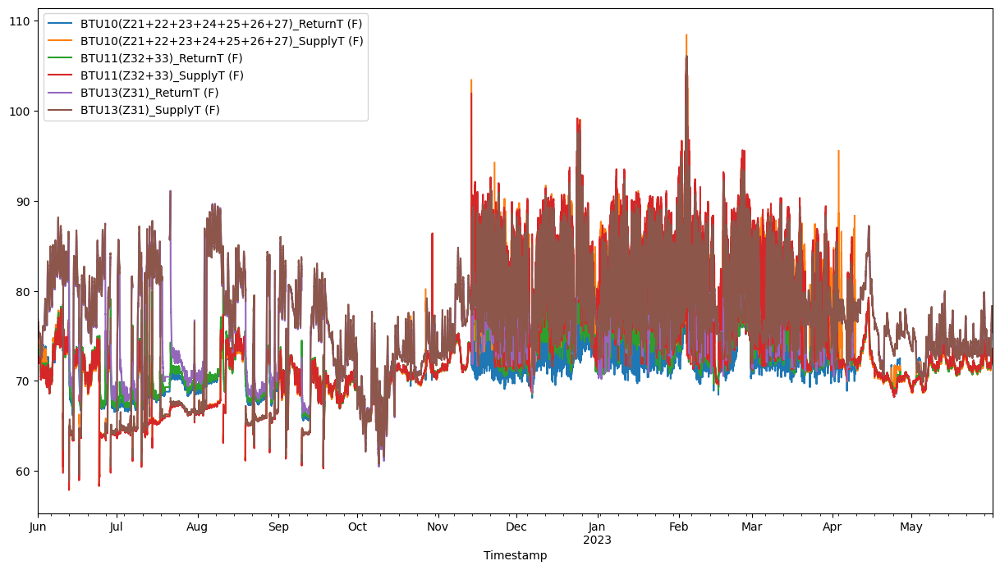

In [25]:
df_with_F[Zone_Temp_fir].plot(figsize=(15, 8))

In [26]:
print(df_with_F.index.min(), df_with_F.index.max())

2022-06-01 00:00:00-04:00 2023-05-31 23:59:00-04:00


<Axes: xlabel='Timestamp'>

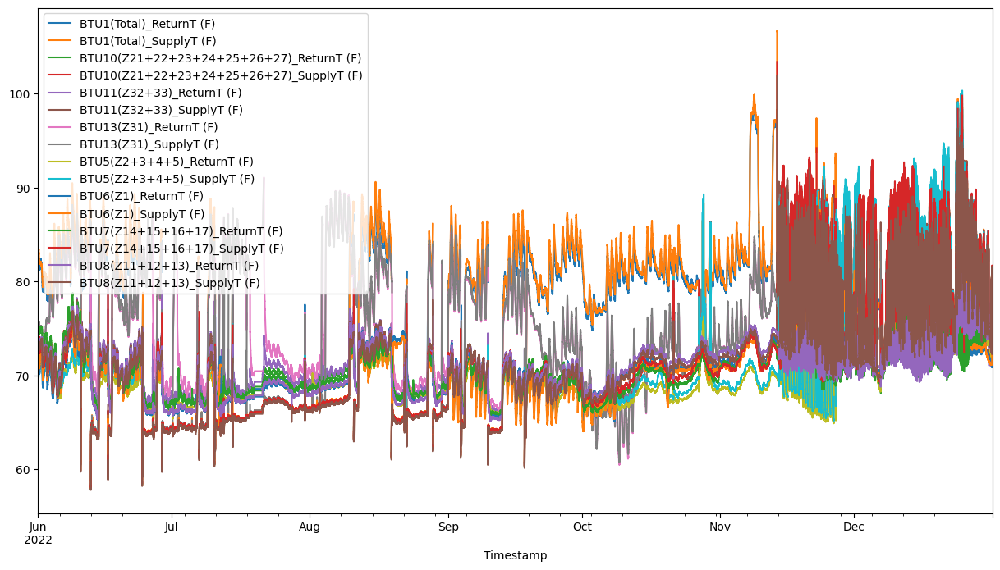

In [27]:
df_with_F1 = df_with_F[: "2022-12-31"]

df_with_F1.plot(figsize=(15, 8))

C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\338759660.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)
C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\338759660.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)


<Axes: xlabel='Timestamp'>

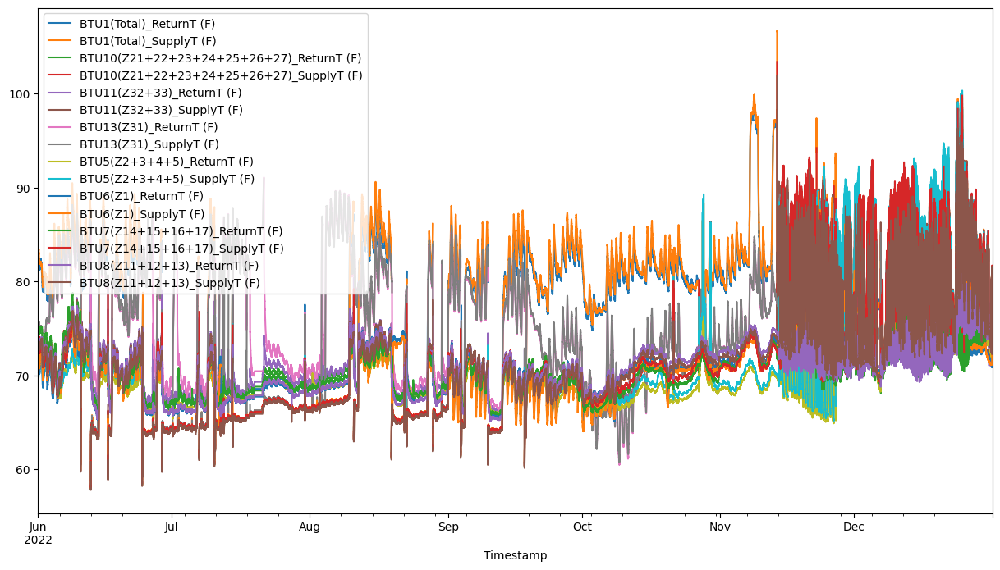

In [28]:
df_with_F1 = remove_outliers(df_with_F1, Zone_Temp_base)
df_with_F1 = remove_outliers(df_with_F1, Zone_Temp_fir)

df_with_F1.plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

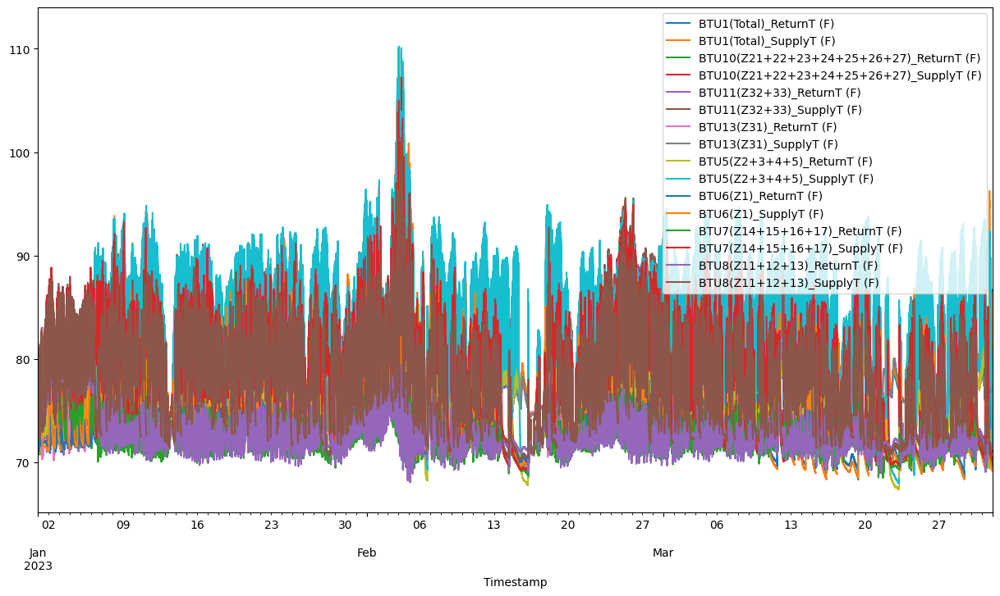

In [29]:
df_with_F2 = df_with_F["2023-01-01": "2023-03-31"]

df_with_F2.plot(figsize=(15, 8))

C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\338759660.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)
C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\338759660.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)


<Axes: xlabel='Timestamp'>

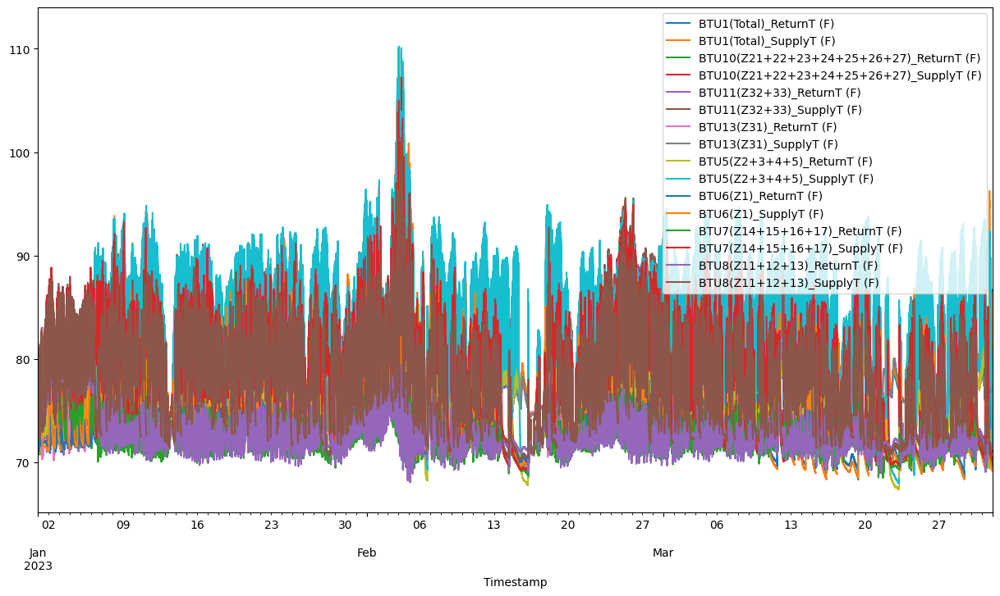

In [30]:
df_with_F2 = remove_outliers(df_with_F2, Zone_Temp_base)
df_with_F2 = remove_outliers(df_with_F2, Zone_Temp_fir)

df_with_F2.plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

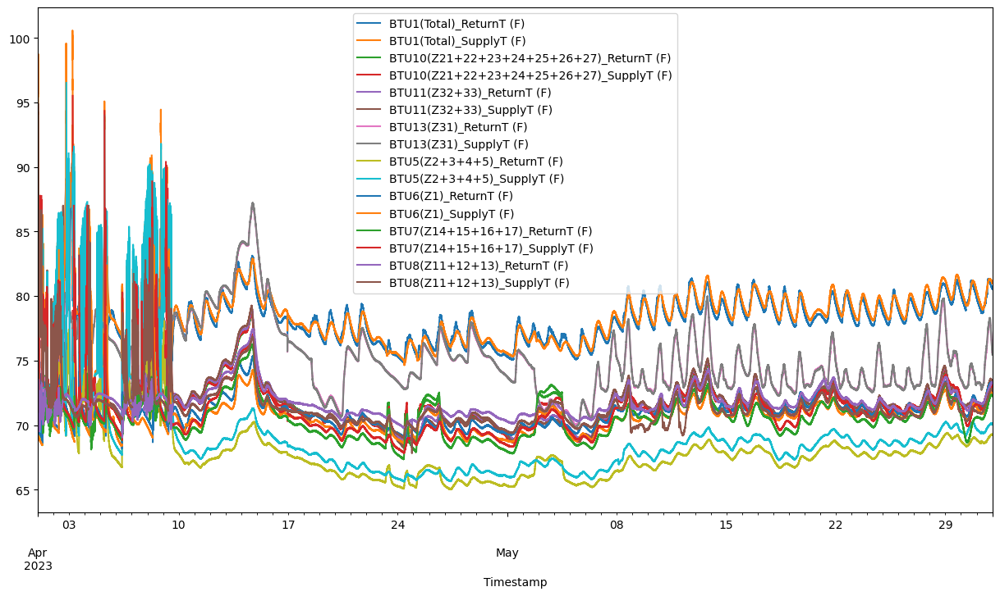

In [32]:
df_with_F3 = df_with_F["2023-04-01": "2023-05-31"]
df_with_F3.plot(figsize=(15, 8))

In [33]:
# Combine all dataframes
combined_df = pd.concat([df_with_F1, df_with_F2, df_with_F3])

In [34]:
# Convert Fahrenheit to Celsius
combined_df = (combined_df - 32) * 5/9
# Renaming columns: Replace 'F' with 'C'
combined_df.columns = [col.replace('F', 'C') for col in combined_df.columns]

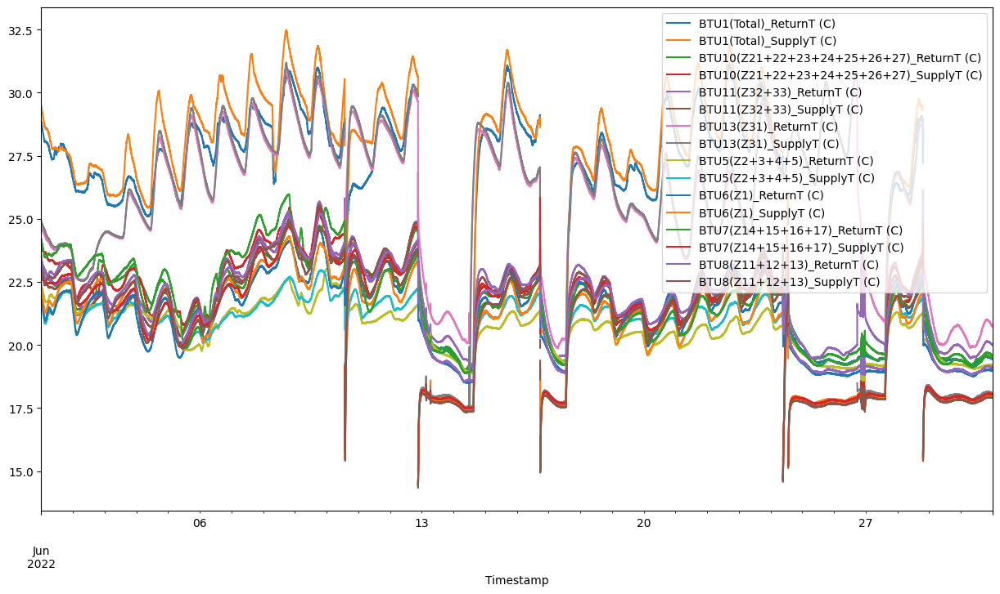

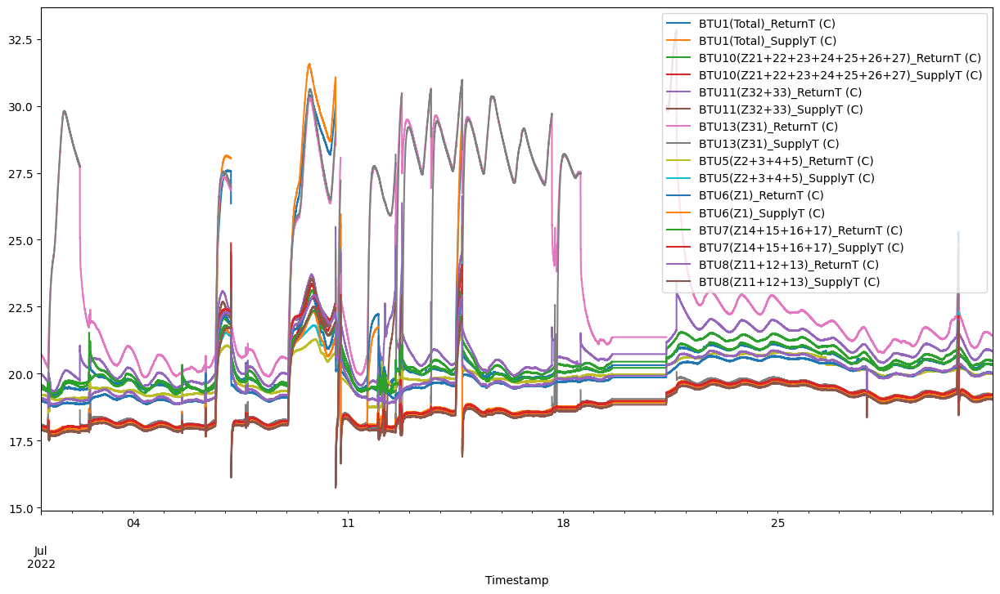

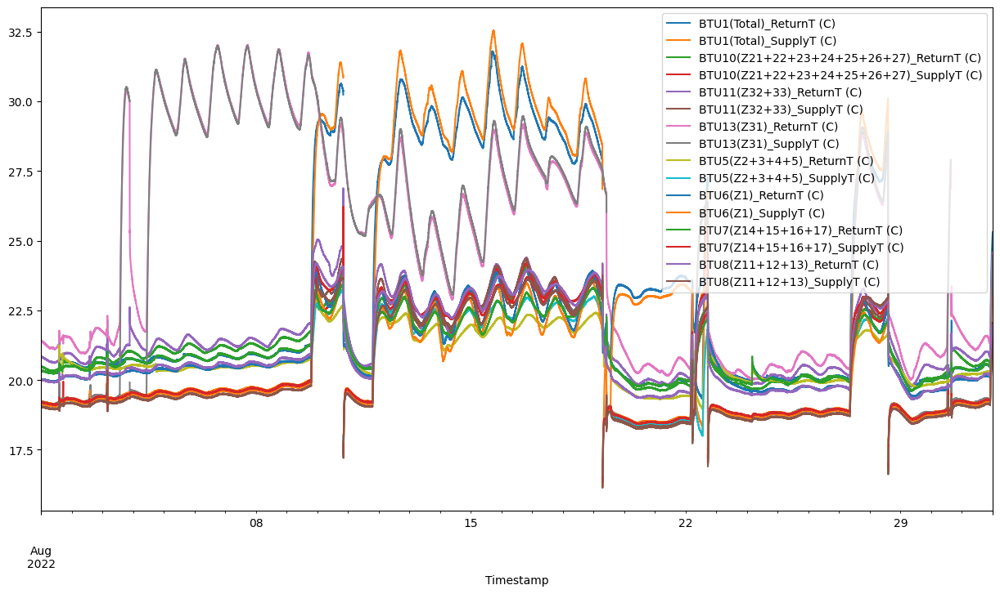

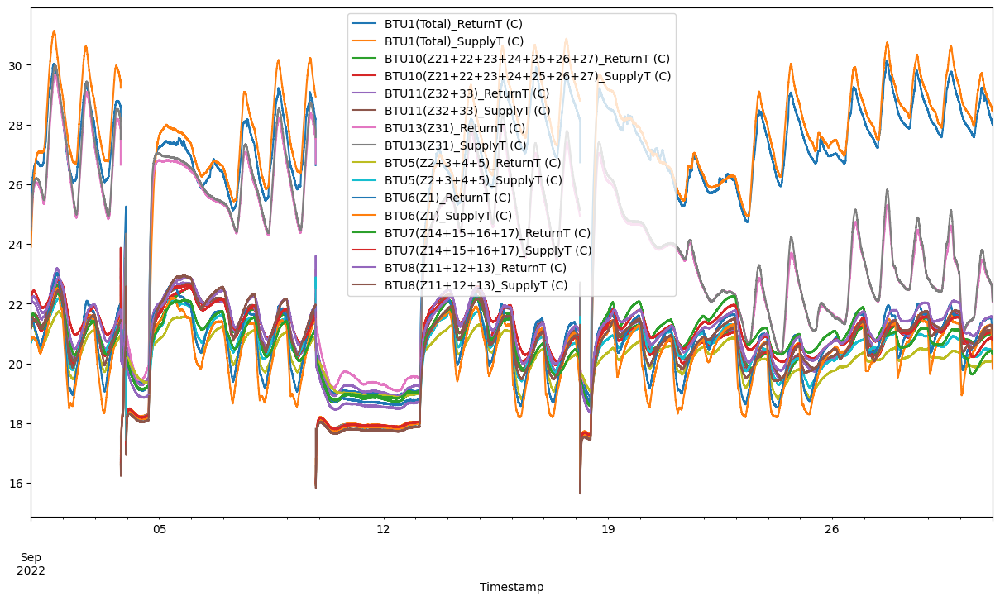

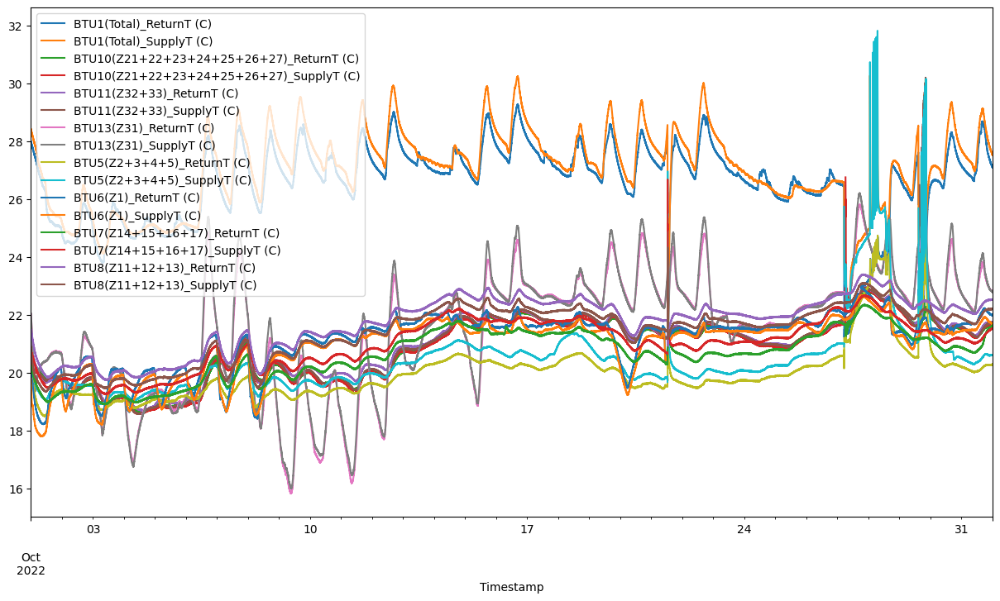

...

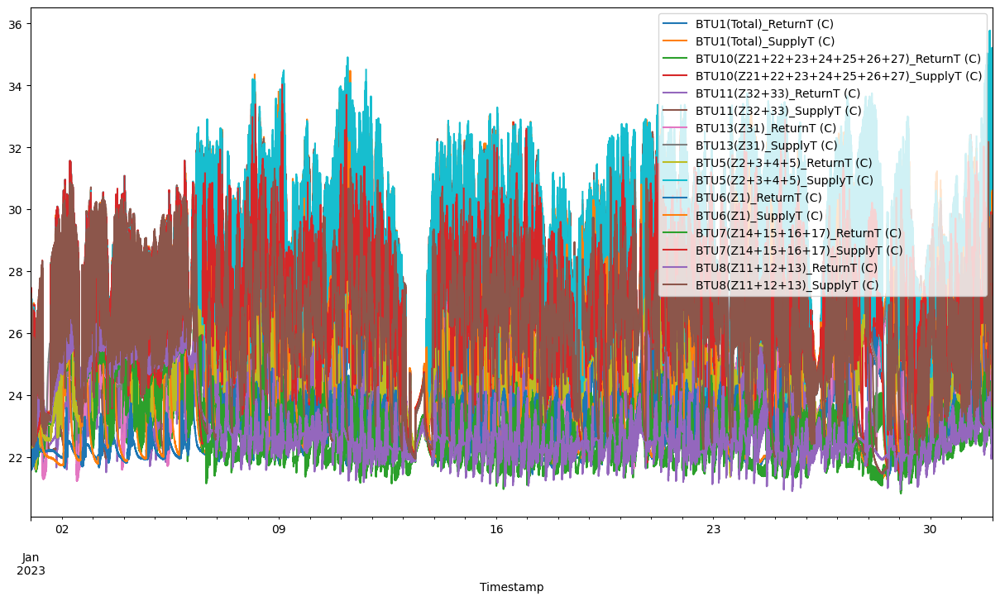

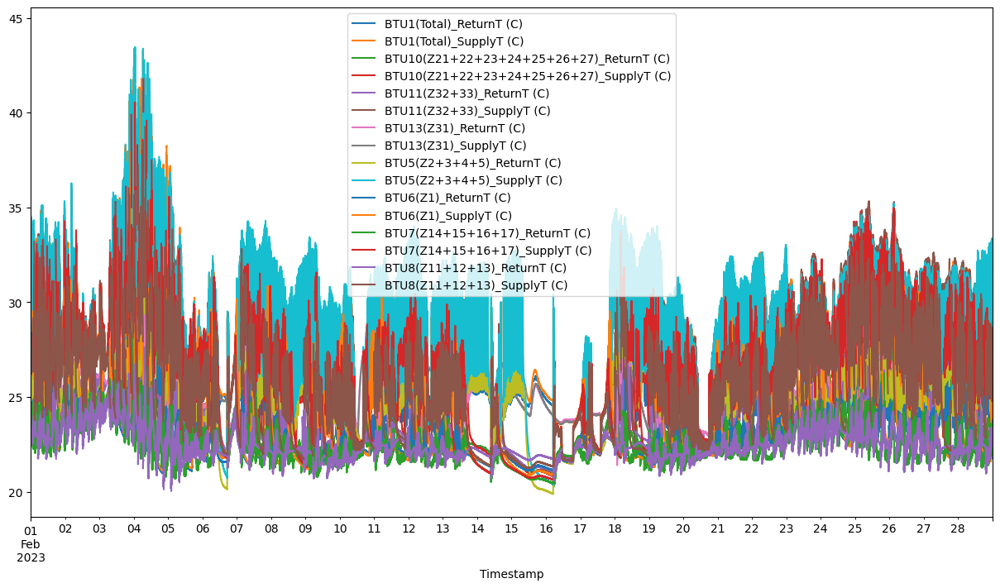

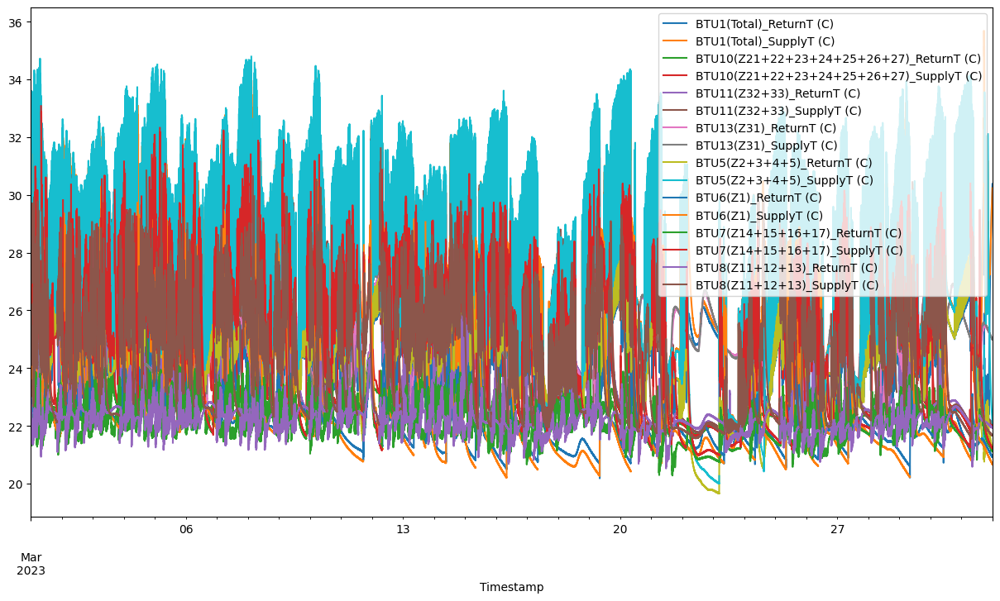

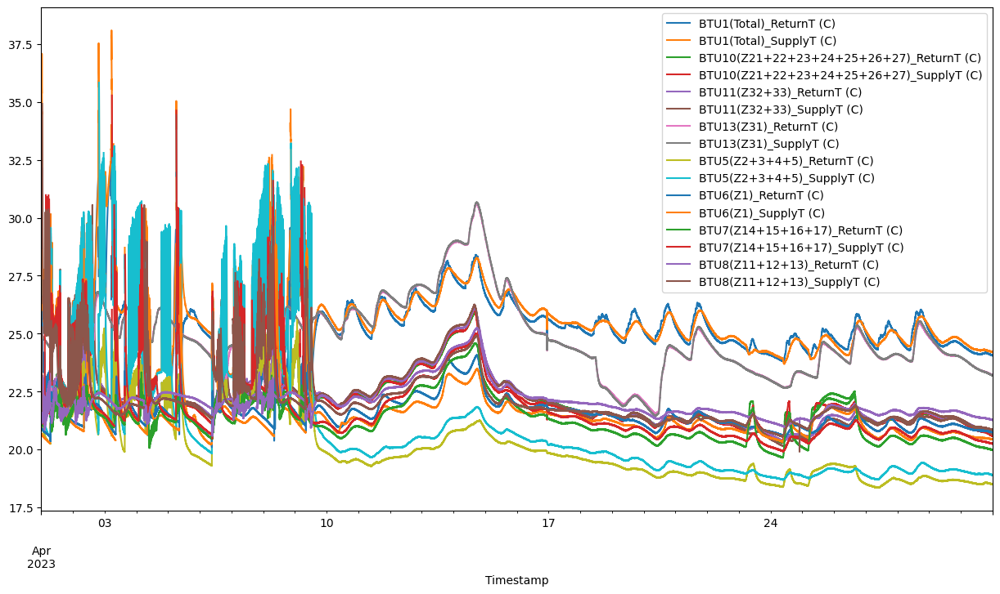

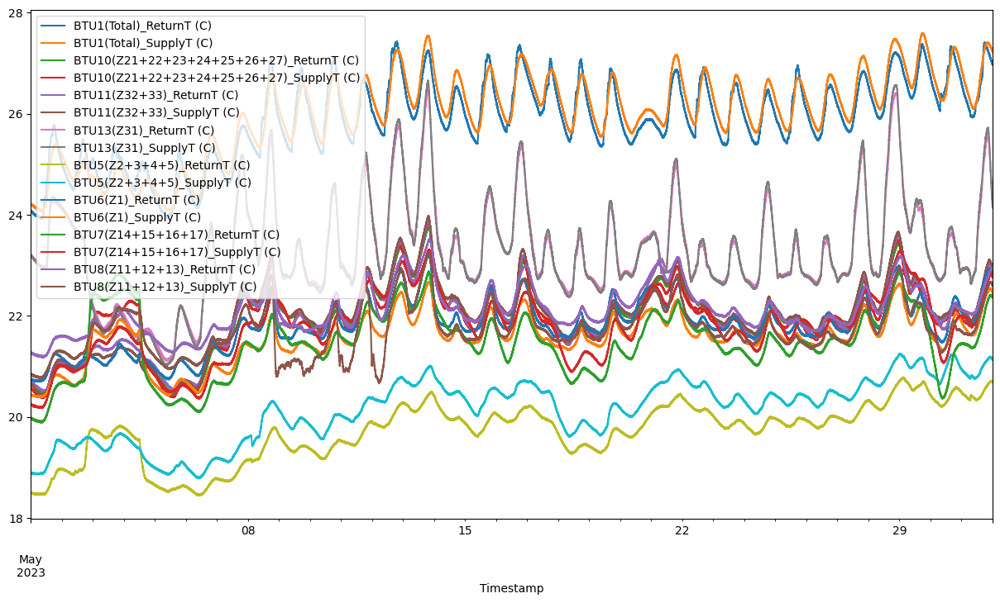

In [35]:
for (year, month), group in combined_df.groupby([combined_df.index.year, combined_df.index.month]):

    group.plot(figsize=(15, 8))

In [36]:
# Detecting rows with repeated values
repeated_index = (combined_df.diff() == 0).all(axis=1)
repeated_rows = combined_df[repeated_index]

# Now let's get the index of the repeated rows
repeated_rows_index = repeated_rows.index.tolist()
repeated_rows_index

[Timestamp('2022-06-05 01:03:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-05 17:03:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-06 11:03:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-08 01:20:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-08 06:03:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 11:58:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 11:59:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:01:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:02:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:03:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:04:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:05:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:06:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:07:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:08:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:09:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-09 12:10:00

In [37]:
combined_df[repeated_index] = np.nan

In [38]:
df_total = pd.concat([combined_df, df_without_F], axis=1)

In [39]:
df_total

,BTU1(Total)_ReturnT (C),BTU1(Total)_SupplyT (C),BTU10(Z21+22+23+24+25+26+27)_ReturnT (C),BTU10(Z21+22+23+24+25+26+27)_SupplyT (C),BTU11(Z32+33)_ReturnT (C),BTU11(Z32+33)_SupplyT (C),BTU13(Z31)_ReturnT (C),BTU13(Z31)_SupplyT (C),BTU5(Z2+3+4+5)_ReturnT (C),BTU5(Z2+3+4+5)_SupplyT (C),...,BTU13(Z31)_energy (kBTU/h),BTU13(Z31)_flow (GPM),BTU5(Z2+3+4+5)_energy (kBTU/h),BTU5(Z2+3+4+5)_flow (GPM),BTU6(Z1)_energy (kBTU/h),BTU6(Z1)_flow (GPM),BTU7(Z14+15+16+17)_energy (kBTU/h),BTU7(Z14+15+16+17)_flow (GPM),BTU8(Z11+12+13)_energy (kBTU/h),BTU8(Z11+12+13)_flow (GPM)
Timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-01 00:00:00-04:00,28.843007,29.470092,23.282695,23.912625,23.375816,22.691731,24.677196,24.917263,22.402844,21.741740,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-06-01 00:01:00-04:00,28.841065,29.466688,23.280479,23.919385,23.386714,22.698631,24.666697,24.898521,22.415568,21.741744,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-06-01 00:02:00-04:00,28.831177,29.457109,23.279288,23.907428,23.380983,22.692134,24.666782,24.904082,22.403069,21.728884,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-06-01 00:03:00-04:00,28.826447,29.455083,23.271849,23.905665,23.361206,22.688785,24.663739,24.902891,22.404115,21.729257,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-06-01 00:04:00-04:00,28.814880,29.441829,23.270357,23.905521,23.367013,22.695609,24.656932,24.885339,22.388886,21.710409,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-31 23:55:00-04:00,26.967388,27.228249,22.824296,22.767050,22.955492,22.958688,24.253820,24.174004,20.706588,21.143451,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-31 23:56:00-04:00,26.982248,27.234366,22.836482,22.779007,22.935371,22.943272,24.244669,24.160483,20.715832,21.139857,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-31 23:57:00-04:00,26.981663,27.226978,22.823719,22.751177,22.933901,22.946256,24.234835,24.151399,20.693033,21.135029,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


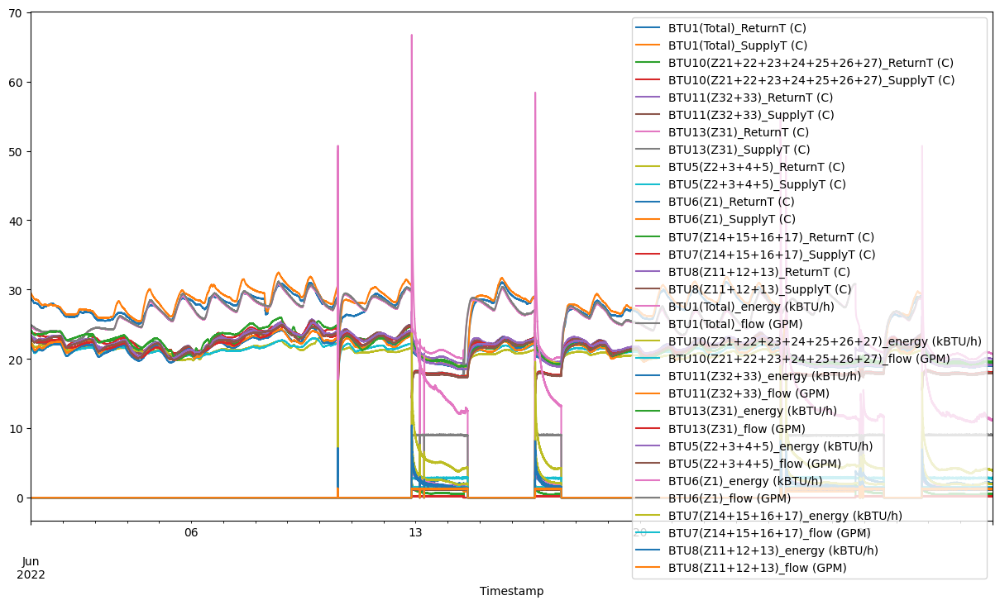

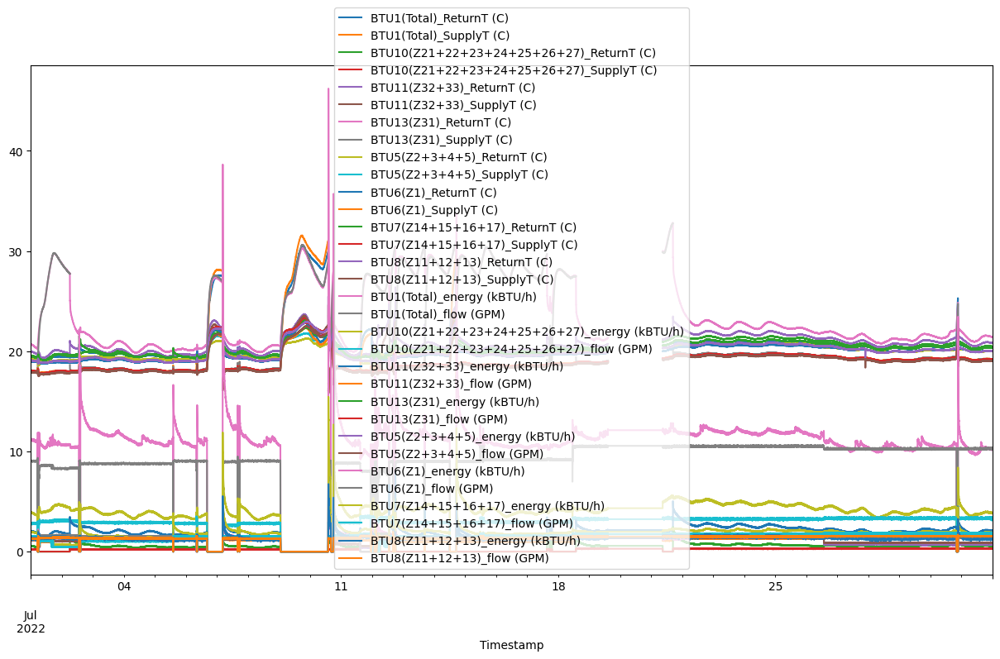

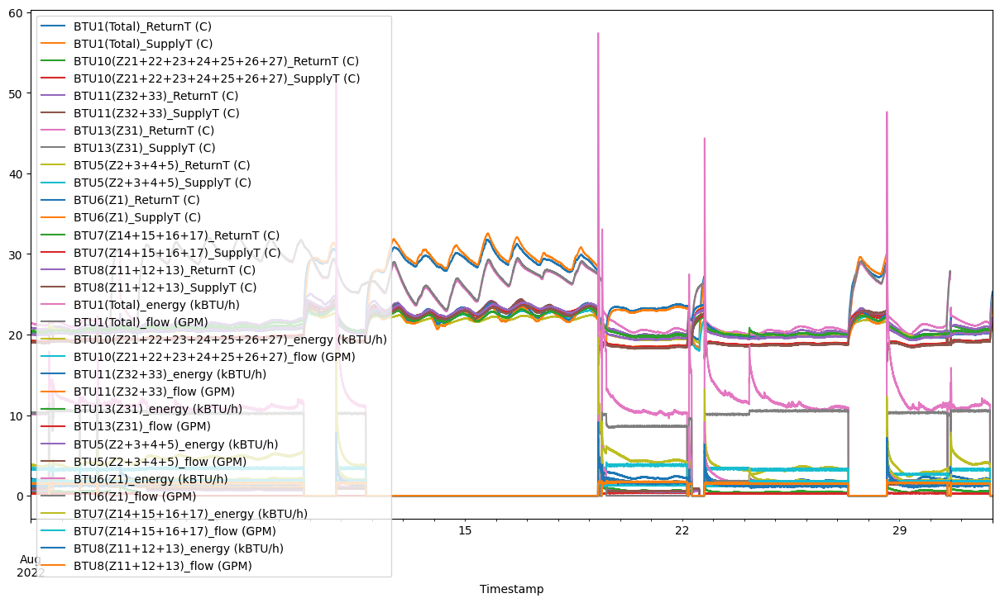

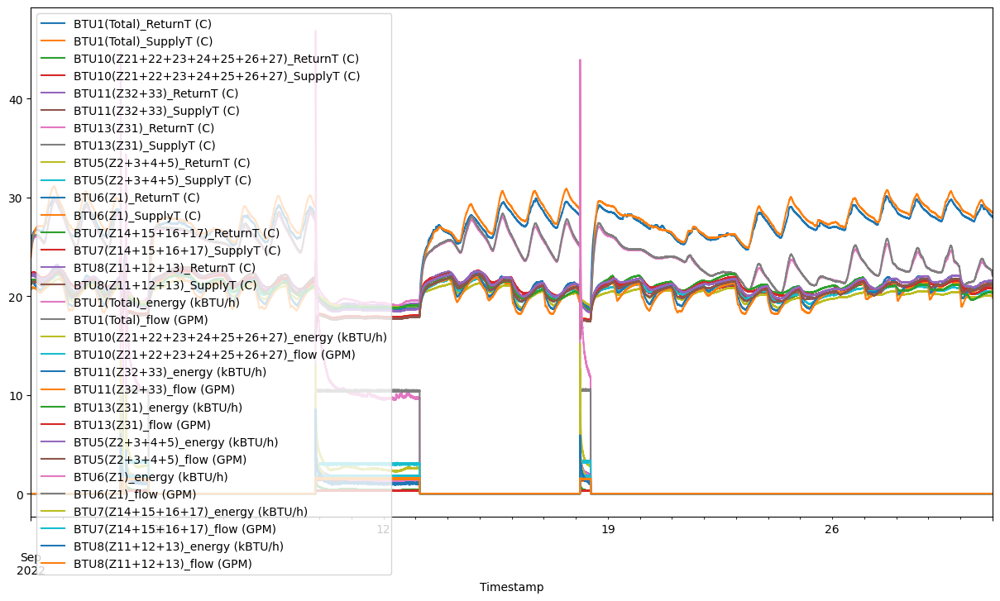

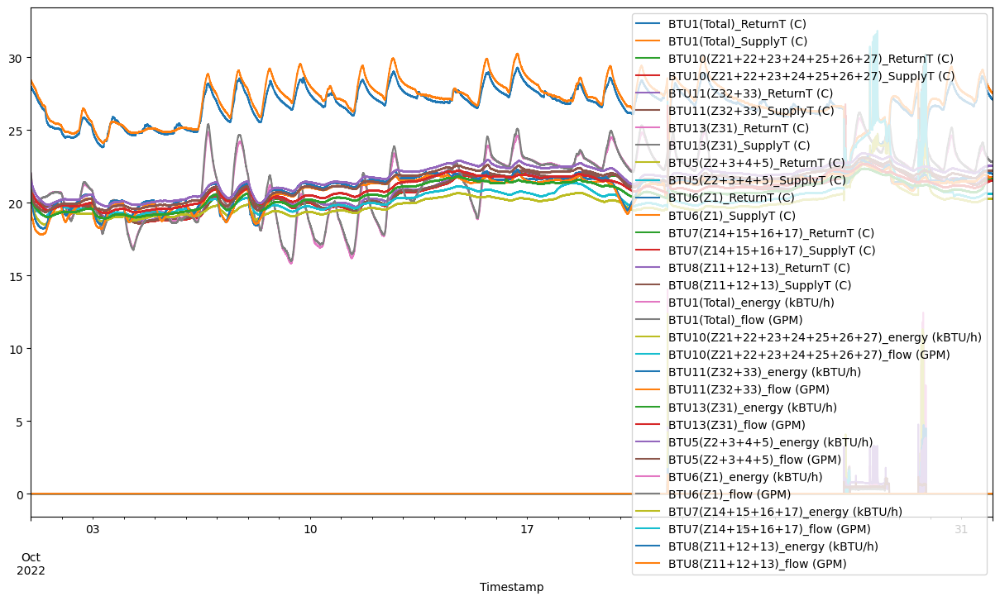

...

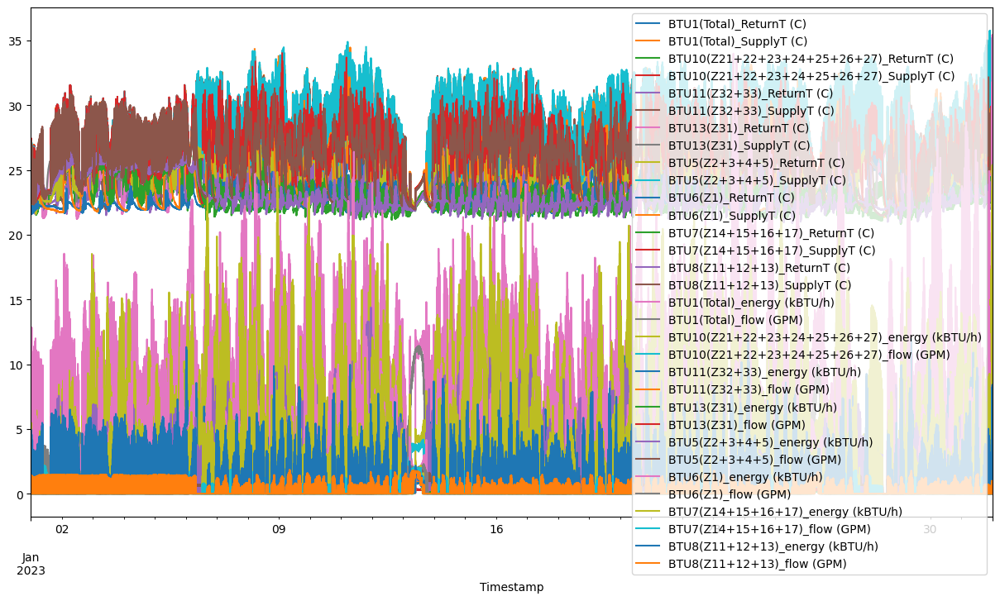

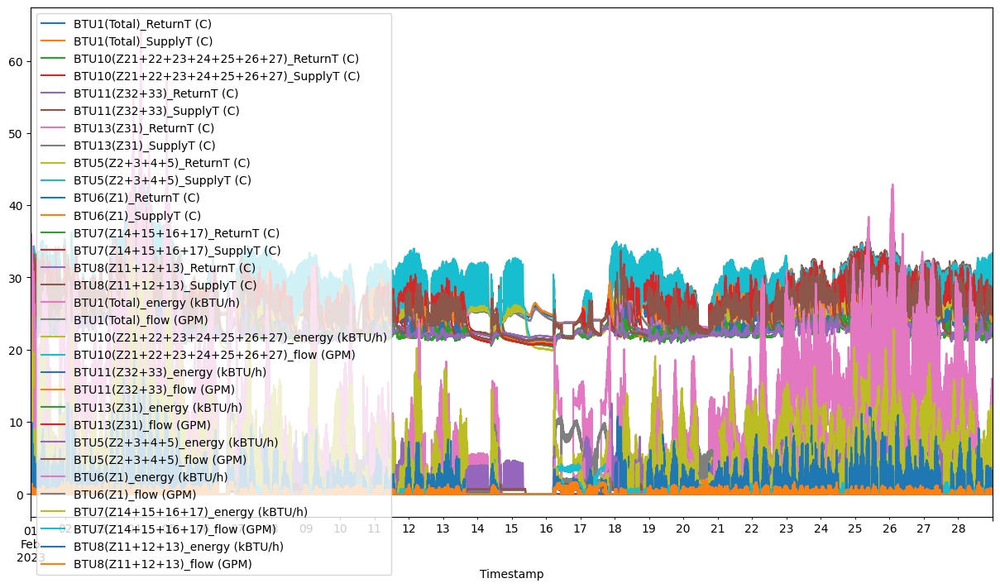

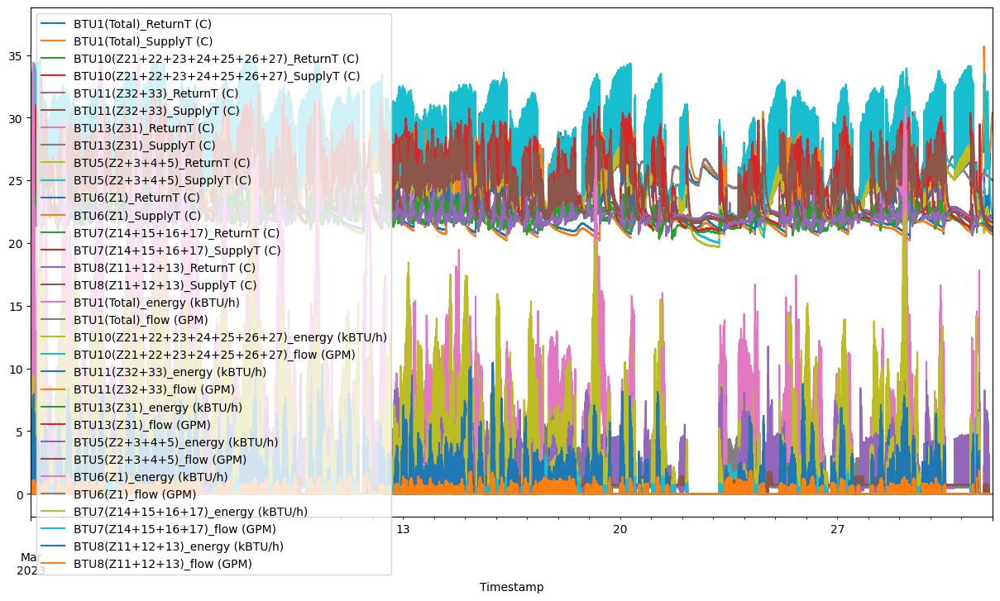

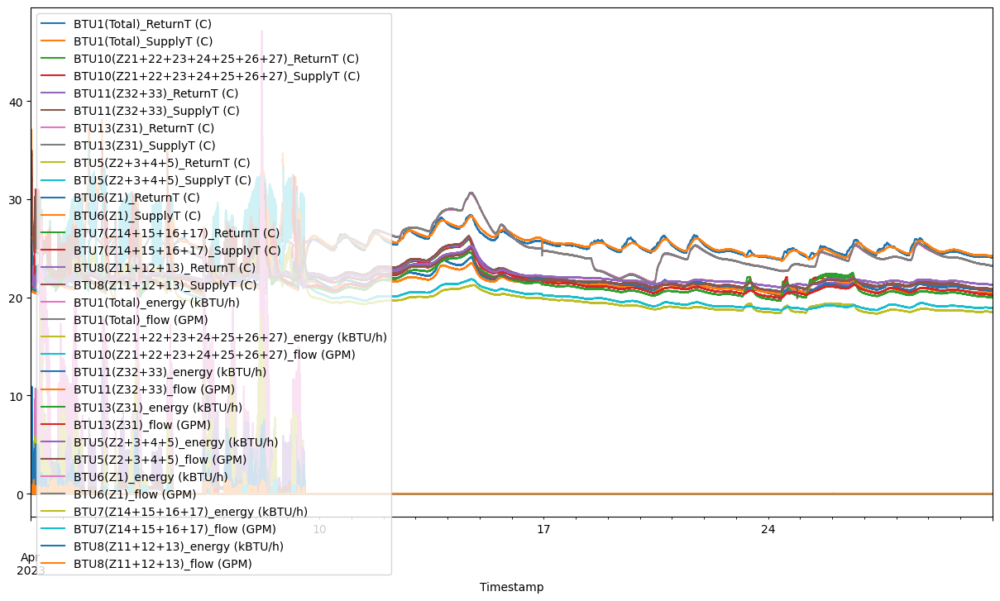

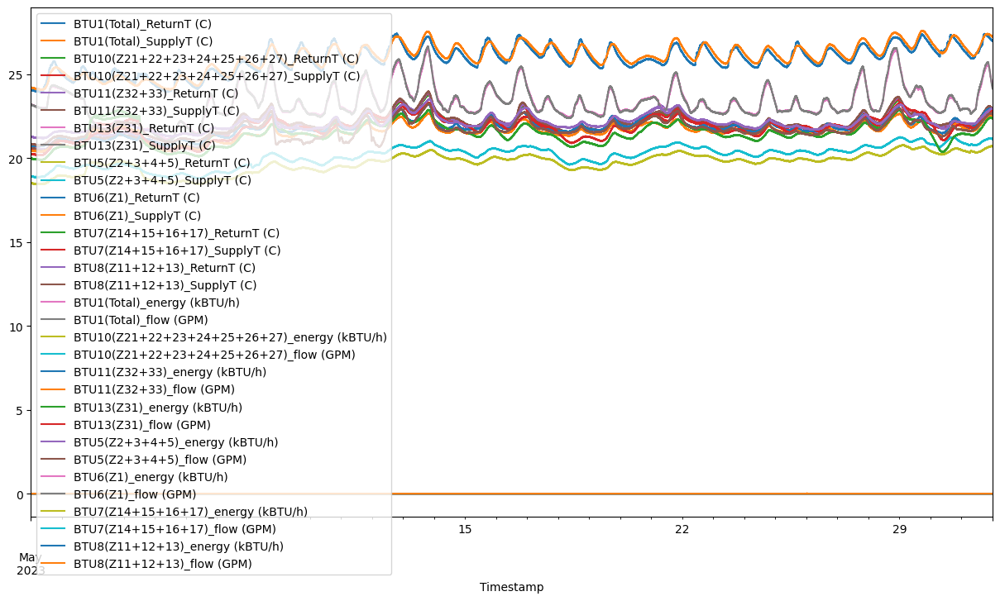

In [40]:
for (year, month), group in df_total.groupby([df_total.index.year, df_total.index.month]):

    group.plot(figsize=(15, 8))

C:\Users\Sang\AppData\Local\Temp\ipykernel_10820\3701859633.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_total = df_total.resample("H").mean().ffill()


<Axes: xlabel='Timestamp'>

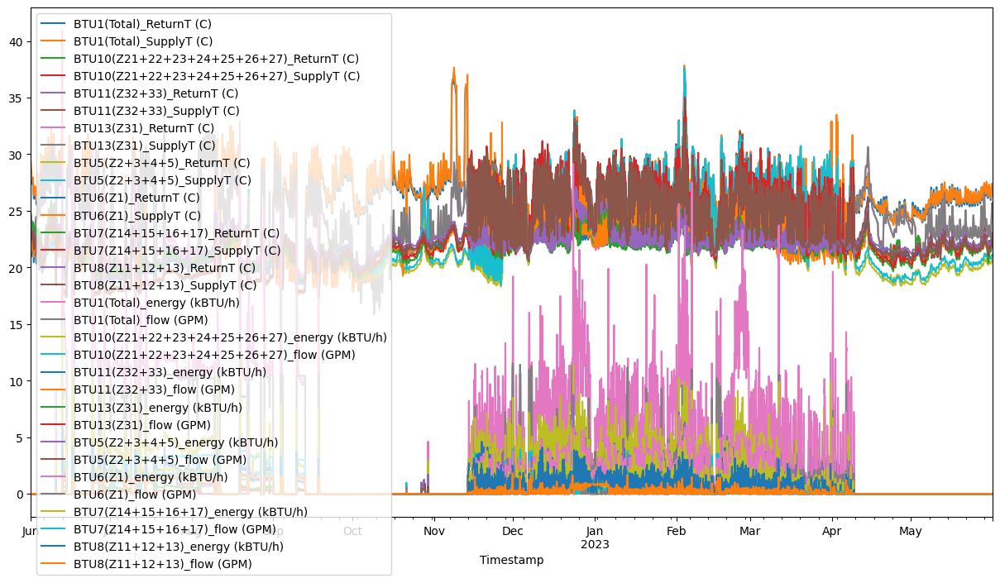

In [41]:
df_total = df_total.resample("H").mean().ffill()

df_total.plot(figsize=(15, 8))

In [42]:
#Missing data check code
def find_nan_sequences(series):
    is_nan = series.isna()
    if is_nan.any():
        start = end = None
        for i, val in enumerate(is_nan):
            if val and start is None:
                start = i
            elif not val and start is not None:
                end = i - 1
                yield (series.index[start], series.index[end])
                start = end = None
        if start is not None:
            yield (series.index[start], series.index[-1])

# Find and print start and end indices of NaN sequences in each column
empDF = pd.DataFrame()
LstN = []
LstS = []
LstE = []

for column in df_total.columns:
    for start, end in find_nan_sequences(df_total[column]):
        print(f"Missing period:'{column}' from {start} to {end}")
        LstN.append(column)
        LstS.append(start)
        LstE.append(end)
        
empDF["names"] = LstN
empDF["start"] = LstS
empDF["end"] = LstE

In [43]:
empDF.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Missing Intervals\Year3\Missing_periods_BTU_TABS_Year3.csv', index=False)

In [44]:
df_total.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Processed\Year3\Zone_BTU_TABS_Year3.csv', index=True)